# SKIN_TONE_DETECTOR_USING_MOBILENETV2

## IMPORT LIBRARY

In [199]:
import os
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import csv
import ast
import cv2
import time
from collections import defaultdict 
from tensorflow.keras.models import load_model
import logging
import numpy
import math


In [200]:
np.random.seed(42)
tf.random.set_seed(42)

## PREPROCESS DATA

### EXTRACT FACE-ONLY IMAGE

In [ ]:
import os
from mtcnn import MTCNN
import cv2

source_directory = 'public_test'
destination_directory = 'public_test_data'

os.makedirs(destination_directory, exist_ok=True)

mtcnn = MTCNN()

batch_size = 10  # Number of images to process in a batch

image_filenames = sorted([filename for filename in os.listdir(source_directory) if filename.lower().endswith(('.jpg', '.jpeg', '.png'))])

for batch_start in range(0, len(image_filenames), batch_size):
    batch_end = batch_start + batch_size
    batch_image_filenames = image_filenames[batch_start:batch_end]

    for image_filename in batch_image_filenames:
        image_path = os.path.join(source_directory, image_filename)
        image = cv2.imread(image_path)

        try:
            faces = mtcnn.detect_faces(image)
        except Exception as e:
            print(f"Error detecting faces in {image_filename}: {e}")
            continue  # Skip this image and move to the next

        if len(faces) > 0:
            largest_face = max(faces, key=lambda f: f['box'][2] * f['box'][3])
            x, y, w, h = largest_face['box']

            min_face_size = 50
            if w > min_face_size and h > min_face_size:
                face = image[y:y+h, x:x+w]

                extracted_face_filename = f'{os.path.splitext(image_filename)[0]}_face.jpg'
                extracted_face_path = os.path.join(destination_directory, extracted_face_filename)

                cv2.imwrite(extracted_face_path, face)
            else:
                print(f"Face in {image_filename} is too small and will be skipped.")
        else:
            print(f"No face detected in {image_filename}.")

    print(f"Processed images {batch_start+1} to {min(batch_end, len(image_filenames))}.")

print("Face extraction complete.")


### MAP LABEL 

In [206]:
def create_map_from_csv(file_path, image_data):
    label_map = {}
    bbox_map = {}

    with open(file_path, 'r') as csv_file:
        csv_reader = csv.reader(csv_file)
        next(csv_reader)  # Skip the header
        
        for row in csv_reader:
            if len(row) >= 4:  # Đảm bảo có ít nhất 4 giá trị trên hàng
                key = row[0]  # file_name
                height = row[1]  # height
                width = row[2]  # width
                bbox = ast.literal_eval(row[3])  # bbox, convert string to tuple
                age = row[4]  # age
                race = row[5]  # race
                masked = row[6]  # masked
                skintone = row[7]  # skintone
                emotion = row[8]  # emotion
                gender = row[9]  # gender
                
                # Printing out each variable
                print(f"Key: {key}, Height: {height}, Width: {width}, BBox: {bbox}, Age: {age}, Race: {race}, Masked: {masked}, Skintone: {skintone}, Emotion: {emotion}, Gender: {gender}")
                
                label_map[key] = skintone
                bbox_map[key] = tuple(bbox)
                image_data.append(key)

    return label_map, bbox_map

In [216]:
def create_map_from_csv2(file_path, image_data):
    label_map = {}
    bbox_map = {}

    with open(file_path, 'r') as csv_file:
        csv_reader = csv.reader(csv_file)
        next(csv_reader)  # Skip the header
        
        for row in csv_reader:
            if len(row) >= 4:  # Đảm bảo có ít nhất 4 giá trị trên hàng
                key = row[0]  # file_name
                height = row[1]  # height
                width = row[2]  # width
                image_id = row[3]
                bbox = ast.literal_eval(row[4])  # bbox, convert string to tuple
                skintone = row[5]  # age
                age = row[6]  # race
                race = row[7]  # masked
                emotion = row[8]  # skintone
                gender = row[9]  # emotion
                masked = row[10]  # gender
                
                # Printing out each variable
                print(f"Key: {key}, Height: {height}, Width: {width}, BBox: {bbox}, Age: {age}, Race: {race}, Masked: {masked}, Skintone: {skintone}, Emotion: {emotion}, Gender: {gender}")
                
                label_map[key] = skintone
                bbox_map[key] = tuple(bbox)
                image_data.append(key)

    return label_map, bbox_map

csv_file_path = "labels.csv"
image_data = []
label_map, bbox_map = create_map_from_csv(csv_file_path, image_data)

print(image_data)
print(label_map)
print(bbox_map)

Key: 100013282.jpg, Height: 1333, Width: 2000, BBox: [934.0000000000097, 144.82228672769534, 238.24562254582438, 330.0662796338281], Age: 20-30s, Race: Caucasian, Masked: unmasked, Skintone: mid-light, Emotion: Neutral, Gender: Male
Key: 100016175.jpg, Height: 1333, Width: 2000, BBox: [1094.0513571635438, 422.91772295627203, 55.45378576262131, 71.31039238064413], Age: 20-30s, Race: Caucasian, Masked: unmasked, Skintone: light, Emotion: Neutral, Gender: Male
Key: 10004189.jpg, Height: 2000, Width: 1333, BBox: [419.93871061403877, 269.1250391680045, 377.1906900618241, 491.11567140388684], Age: 20-30s, Race: Mongoloid, Masked: unmasked, Skintone: light, Emotion: Happiness, Gender: Female
Key: 100104575.jpg, Height: 1333, Width: 2000, BBox: [1490.6909678848915, 676.0000000000097, 37.55392769189032, 70.33067590805737], Age: 20-30s, Race: Caucasian, Masked: unmasked, Skintone: mid-light, Emotion: Neutral, Gender: Male
Key: 100104600.jpg, Height: 2000, Width: 1333, BBox: [549.169724453414, 92

In [215]:
def create_map_from_csv2(file_path, image_data):
    label_map = {}
    bbox_map = {}

    with open(file_path, 'r') as csv_file:
        csv_reader = csv.reader(csv_file)
        next(csv_reader)  # Skip the header
        
        with open("labels.csv", "a", newline='') as new_csv_file:
            csv_writer = csv.writer(new_csv_file)
            
            for row in csv_reader:
                if len(row) >= 11:  # Đảm bảo có đủ 11 giá trị trên hàng
                    key = row[0]  # file_name
                    height = row[1]  # height
                    width = row[2]  # width
                    image_id = row[3]
                    bbox = ast.literal_eval(row[4])  # bbox, convert string to tuple
                    skintone = row[5]  # age
                    age = row[6]  # race
                    race = row[7]  # masked
                    emotion = row[8]  # skintone
                    gender = row[9]  # emotion
                    masked = row[10]  # gender

                    # Printing out each variable
                    print(f"Key: {key}, Height: {height}, Width: {width}, BBox: {bbox}, Age: {age}, Race: {race}, Masked: {masked}, Skintone: {skintone}, Emotion: {emotion}, Gender: {gender}")

                    # Thêm vào các map
                    label_map[key] = skintone
                    bbox_map[key] = tuple(bbox)
                    image_data.append([key, height, width, bbox, age, race, masked, skintone, emotion, gender])

                    # Ghi vào file CSV mới
                    csv_writer.writerow([key, height, width, bbox, age, race, masked, skintone, emotion, gender])

    return label_map, bbox_map, image_data

# Sử dụng hàm
csv_file_path = "labels_for_more_training_data.csv"  # Thay đổi đường dẫn đến file CSV của bạn
image_data = []
label_map, bbox_map, image_data = create_map_from_csv2(csv_file_path, image_data)

# In danh sách các giá trị theo thứ tự mong muốn
for item in image_data:
    print(item)


Key: 10003832.jpg, Height: 2000, Width: 1459, BBox: [584.1895944369563, 301.32785213219023, 265.7472074173906, 325.54338524217644], Age: 20-30s, Race: Mongoloid, Masked: unmasked, Skintone: mid-light, Emotion: Anger, Gender: Male
Key: 10005259.jpg, Height: 1395, Width: 2000, BBox: [1131.1132364709713, 312.5498771883628, 285.1000631711058, 385.9086669006094], Age: 20-30s, Race: Mongoloid, Masked: unmasked, Skintone: light, Emotion: Neutral, Gender: Male
Key: 10005527.jpg, Height: 1507, Width: 2000, BBox: [548.0171526364226, 265.9999999999995, 246.98076825612836, 243.99999999999793], Age: 20-30s, Race: Mongoloid, Masked: unmasked, Skintone: mid-light, Emotion: Sadness, Gender: Female
Key: 100086002.jpg, Height: 1334, Width: 2000, BBox: [900.5677208085174, 57.13482704531668, 163.8486494558082, 251.9092805776208], Age: 20-30s, Race: Mongoloid, Masked: unmasked, Skintone: light, Emotion: Neutral, Gender: Female
Key: 100148503.jpg, Height: 1561, Width: 2000, BBox: [862.5207825161339, 478.999

In [217]:
print(len(image_data))

28048


### EXTRACT SKIN 

In [24]:
def find_images(path, recursive=False, ignore=True):
    if os.path.isfile(path):
        yield path
    elif os.path.isdir(path):
        assert os.path.isdir(path), 'FileIO - get_images: Directory does not exist'
        assert isinstance(recursive, bool), 'FileIO - get_images: recursive must be a boolean variable'
        ext, result = ['png', 'jpg', 'jpeg'], []
        for path_a in os.listdir(path):
            path_a = path + '/' + path_a
            if os.path.isdir(path_a) and recursive:
                for path_b in find_images(path_a):
                    yield path_b
            check_a = path_a.split('.')[-1] in ext
            check_b = ignore or ('-' not in path_a.split('/')[-1])
            if check_a and check_b:
                yield path_a
    else:
        raise ValueError('error! path is not a valid path or directory')


def display(title, img, max_size=200000):
    assert isinstance(img, numpy.ndarray), 'img must be a numpy array'
    assert isinstance(title, str), 'title must be a string'
    scale = numpy.sqrt(min(1.0, float(max_size) / (img.shape[0] * img.shape[1])))
    shape = (int(scale * img.shape[1]), int(scale * img.shape[0]))
    img = cv2.resize(img, shape)
    cv2.imshow(title, img)
    
    

logger = logging.getLogger('main')


def get_hsv_mask(img, debug=False):
    assert isinstance(img, numpy.ndarray), 'image must be a numpy array'
    assert img.ndim == 3, 'skin detection can only work on color images'
    logger.debug('getting hsv mask')

    lower_thresh = numpy.array([0, 50, 0], dtype=numpy.uint8)
    upper_thresh = numpy.array([120, 150, 255], dtype=numpy.uint8)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    msk_hsv = cv2.inRange(img_hsv, lower_thresh, upper_thresh)

    msk_hsv[msk_hsv < 128] = 0
    msk_hsv[msk_hsv >= 128] = 1

    if debug:
        display('input', img)
        display('mask_hsv', msk_hsv)

    return msk_hsv.astype(float)


def get_rgb_mask(img, debug=False):
    assert isinstance(img, numpy.ndarray), 'image must be a numpy array'
    assert img.ndim == 3, 'skin detection can only work on color images'
    logger.debug('getting rgb mask')

    lower_thresh = numpy.array([45, 52, 108], dtype=numpy.uint8)
    upper_thresh = numpy.array([255, 255, 255], dtype=numpy.uint8)

    mask_a = cv2.inRange(img, lower_thresh, upper_thresh)
    mask_b = 255 * ((img[:, :, 2] - img[:, :, 1]) / 20)
    mask_c = 255 * ((numpy.max(img, axis=2) - numpy.min(img, axis=2)) / 20)
    # msk_rgb = cv2.bitwise_and(mask_c, cv2.bitwise_and(mask_a, mask_b))
    mask_d = numpy.bitwise_and(numpy.uint64(mask_a), numpy.uint64(mask_b))
    msk_rgb = numpy.bitwise_and(numpy.uint64(mask_c), numpy.uint64(mask_d))

    msk_rgb[msk_rgb < 128] = 0
    msk_rgb[msk_rgb >= 128] = 1

    if debug:
        display('input', img)
        display('mask_rgb', msk_rgb)

    return msk_rgb.astype(float)


def get_ycrcb_mask(img, debug=False):
    assert isinstance(img, numpy.ndarray), 'image must be a numpy array'
    assert img.ndim == 3, 'skin detection can only work on color images'
    logger.debug('getting ycrcb mask')

    lower_thresh = numpy.array([90, 100, 130], dtype=numpy.uint8)
    upper_thresh = numpy.array([230, 120, 180], dtype=numpy.uint8)

    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCR_CB)
    msk_ycrcb = cv2.inRange(img_ycrcb, lower_thresh, upper_thresh)

    msk_ycrcb[msk_ycrcb < 128] = 0
    msk_ycrcb[msk_ycrcb >= 128] = 1

    if debug:
        display('input', img)
        display('mask_ycrcb', msk_ycrcb)

    return msk_ycrcb.astype(float)


def grab_cut_mask(img_col, mask, debug=False):
    assert isinstance(img_col, numpy.ndarray), 'image must be a numpy array'
    assert isinstance(mask, numpy.ndarray), 'mask must be a numpy array'
    assert img_col.ndim == 3, 'skin detection can only work on color images'
    assert mask.ndim == 2, 'mask must be 2D'

    kernel = numpy.ones((50, 50), numpy.float32) / (50 * 50)
    dst = cv2.filter2D(mask, -1, kernel)
    dst[dst != 0] = 255
    free = numpy.array(cv2.bitwise_not(dst), dtype=numpy.uint8)

    if debug:
        display('not skin', free)
        display('grabcut input', mask)

    grab_mask = numpy.zeros(mask.shape, dtype=numpy.uint8)
    grab_mask[:, :] = 2
    grab_mask[mask == 255] = 1
    grab_mask[free == 255] = 0

    if numpy.unique(grab_mask).tolist() == [0, 1]:
        logger.debug('conducting grabcut')
        bgdModel = numpy.zeros((1, 65), numpy.float64)
        fgdModel = numpy.zeros((1, 65), numpy.float64)

        if img_col.size != 0:
            mask, bgdModel, fgdModel = cv2.grabCut(img_col, grab_mask, None, bgdModel, fgdModel, 5,
                                                   cv2.GC_INIT_WITH_MASK)
            mask = numpy.where((mask == 2) | (mask == 0), 0, 1).astype(numpy.uint8)
        else:
            logger.warning('img_col is empty')

    return mask


def closing(mask):
    assert isinstance(mask, numpy.ndarray), 'mask must be a numpy array'
    assert mask.ndim == 2, 'mask must be a greyscale image'
    logger.debug("closing mask of shape {0}".format(mask.shape))

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)

    return mask


def extract_skin(img, thresh=0.5, debug=False):
    assert isinstance(img, numpy.ndarray), 'image must be a numpy array'
    assert img.ndim == 3, 'skin detection can only work on color images'
    logger.debug("processing image of shape {0}".format(img.shape))

    mask_hsv = get_hsv_mask(img, debug=debug)
    mask_rgb = get_rgb_mask(img, debug=debug)
    mask_ycrcb = get_ycrcb_mask(img, debug=debug)
    
    n_masks = 3.0
    mask = (mask_hsv + mask_rgb + mask_ycrcb) / n_masks

    mask[mask < thresh] = 0.0
    mask[mask >= thresh] = 255.0
    logger.debug('{0}% of the image is skin'.format(int((100.0 / 255.0) * numpy.sum(mask) / mask.size)))

    mask = mask.astype(numpy.uint8)
    mask = closing(mask)
    mask = grab_cut_mask(img, mask, debug=debug)

    # Tạo một hình ảnh mới chỉ chứa phần da
    # Khởi tạo một hình ảnh trắng có cùng kích thước với ảnh gốc
    skin_only_image = np.zeros_like(img, np.uint8) + 255
    
    # Áp dụng mặt nạ để lấy phần da, bỏ qua phần còn lại
    for i in range(3):  # Lặp qua từng kênh màu
        skin_only_image[:, :, i] = cv2.bitwise_and(img[:, :, i], mask)

    return skin_only_image

def filter_out_black(image):
    # Tạo mặt nạ cho các pixel không phải màu đen
    mask = np.all(image != (0, 0, 0), axis=-1)

    # Tạo ảnh mới chứa các pixel không phải màu đen
    non_black_pixels = image[mask]
    if len(non_black_pixels) == 0 :
        return None
    new_height = int(math.sqrt(len(non_black_pixels)))
    new_width = new_height
    non_black_pixels = non_black_pixels[0:new_height*new_width]
    new_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)
    new_image[:len(non_black_pixels) // new_width, :new_width] = non_black_pixels.reshape(-1, new_width, 3)
    return new_image

### CREATE SKIN-ONLY DATA

In [25]:
data_source_path = "D:\Code\BachKhoa\AI Hackathon\mnt\md0\projects\sami-hackathon\private\data"
data_destination_path = "data"

# Tạo các thư mục cho mỗi loại màu da nếu chúng chưa tồn tại
skin_tones = ['dark', 'mid-dark', 'mid-light', 'light']
for tone in skin_tones:
    os.makedirs(os.path.join(data_destination_path, tone), exist_ok=True)

for img in image_data:
    img_link = os.path.join(data_source_path, img)
    image = cv2.imread(img_link)
    bbox = bbox_map[img]
    x, y, w, h = [int(coord) for coord in bbox]
    image = image[y:y+h, x:x+w]
    # image = extract_skin(image)
    
    # image = filter_out_black(image)
    if image is not None:
        label = label_map[img]
        if label in skin_tones:
            # Lưu hình vào thư mục tương ứng
            save_path = os.path.join(data_destination_path, label, img)
            cv2.imwrite(save_path, image)

### INITIALIZE BASIC PARAMETERS FOR TRAINING

In [218]:
dataset_path = 'data'
input_shape = (90, 120, 3)
classes = ['dark', 'mid-dark', 'mid-light', 'light']
EPOCHS = 100  # Increase the number of epochs
BS = 32

data = []
labels = []

### PREPROCESS IMAGES

In [219]:
for idx, class_name in enumerate(classes):
    class_path = os.path.join(dataset_path, class_name)
    for filename in os.listdir(class_path):
        image_path = os.path.join(class_path, filename)
        image = tf.keras.preprocessing.image.load_img(image_path, target_size=input_shape[:2])
        image = tf.keras.preprocessing.image.img_to_array(image)
        image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
        data.append(image)
        labels.append(idx)

In [220]:
data = np.array(data, dtype="float32")
labels = np.array(labels)

### DIVIDE DATA INTO TRAIN_SET AND VALIDATION_SET

In [221]:
trainX, testX, trainY, testY = train_test_split(data, labels, test_size=0.2, stratify=labels, random_state=42)

### GENERATE DATA FOR TRAINING PROCESS

In [222]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

In [223]:
train_datagen = datagen.flow(trainX, trainY, batch_size=BS, shuffle=True)

## TRAIN MobileNetV2 MODEL

In [224]:
base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
base_model.trainable = False

In [225]:
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(256, activation='relu'),
    Dropout(0.4),
    Dense(len(classes), activation='softmax')
])

model.compile(optimizer=Adam(lr=1e-4), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [226]:
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


In [227]:
history = model.fit(
    train_datagen,
    steps_per_epoch=len(trainX) // BS,
    validation_data=(testX, testY),
    validation_steps=len(testX) // BS,
    epochs=EPOCHS,
    callbacks=[lr_scheduler, early_stopping]  # Add both callbacks
)

Epoch 1/100
691/691 [==============================] - ETA: 0s - loss: 0.7180 - accuracy: 0.6864WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 172 batches). You may need to use the repeat() function when building your dataset.


691/691 [==============================] - 173s 245ms/step - loss: 0.7180 - accuracy: 0.6864 - val_loss: 0.6241 - val_accuracy: 0.7228 - lr: 0.0010
Epoch 2/100
691/691 [==============================] - ETA: 0s - loss: 0.6426 - accuracy: 0.7114WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 137s 198ms/step - loss: 0.6426 - accuracy: 0.7114 - lr: 0.0010
Epoch 3/100
691/691 [==============================] - ETA: 0s - loss: 0.6313 - accuracy: 0.7204WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 127s 184ms/step - loss: 0.6313 - accuracy: 0.7204 - lr: 0.0010
Epoch 4/100
691/691 [==============================] - ETA: 0s - loss: 0.6259 - accuracy: 0.7238WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 130s 188ms/step - loss: 0.6259 - accuracy: 0.7238 - lr: 0.0010
Epoch 5/100
691/691 [==============================] - ETA: 0s - loss: 0.6224 - accuracy: 0.7219WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 127s 183ms/step - loss: 0.6224 - accuracy: 0.7219 - lr: 0.0010
Epoch 6/100
691/691 [==============================] - ETA: 0s - loss: 0.6174 - accuracy: 0.7253WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 134s 194ms/step - loss: 0.6174 - accuracy: 0.7253 - lr: 0.0010
Epoch 7/100
691/691 [==============================] - ETA: 0s - loss: 0.6108 - accuracy: 0.7276WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 126s 182ms/step - loss: 0.6108 - accuracy: 0.7276 - lr: 0.0010
Epoch 8/100
691/691 [==============================] - ETA: 0s - loss: 0.6156 - accuracy: 0.7261WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 129s 187ms/step - loss: 0.6156 - accuracy: 0.7261 - lr: 0.0010
Epoch 9/100
691/691 [==============================] - ETA: 0s - loss: 0.6076 - accuracy: 0.7277WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 125s 181ms/step - loss: 0.6076 - accuracy: 0.7277 - lr: 0.0010
Epoch 10/100
691/691 [==============================] - ETA: 0s - loss: 0.6081 - accuracy: 0.7225WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 126s 182ms/step - loss: 0.6081 - accuracy: 0.7225 - lr: 0.0010
Epoch 11/100
691/691 [==============================] - ETA: 0s - loss: 0.6081 - accuracy: 0.7281WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 127s 183ms/step - loss: 0.6081 - accuracy: 0.7281 - lr: 0.0010
Epoch 12/100
691/691 [==============================] - ETA: 0s - loss: 0.6108 - accuracy: 0.7289WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 127s 184ms/step - loss: 0.6108 - accuracy: 0.7289 - lr: 0.0010
Epoch 13/100
691/691 [==============================] - ETA: 0s - loss: 0.6024 - accuracy: 0.7294WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 124s 179ms/step - loss: 0.6024 - accuracy: 0.7294 - lr: 0.0010
Epoch 14/100
691/691 [==============================] - ETA: 0s - loss: 0.6037 - accuracy: 0.7313WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 136s 197ms/step - loss: 0.6037 - accuracy: 0.7313 - lr: 0.0010
Epoch 15/100
691/691 [==============================] - ETA: 0s - loss: 0.6039 - accuracy: 0.7310WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 165s 239ms/step - loss: 0.6039 - accuracy: 0.7310 - lr: 0.0010
Epoch 16/100
691/691 [==============================] - ETA: 0s - loss: 0.5980 - accuracy: 0.7289WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 163s 236ms/step - loss: 0.5980 - accuracy: 0.7289 - lr: 0.0010
Epoch 17/100
691/691 [==============================] - ETA: 0s - loss: 0.5978 - accuracy: 0.7330WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 153s 221ms/step - loss: 0.5978 - accuracy: 0.7330 - lr: 0.0010
Epoch 18/100
691/691 [==============================] - ETA: 0s - loss: 0.5950 - accuracy: 0.7327WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 165s 238ms/step - loss: 0.5950 - accuracy: 0.7327 - lr: 0.0010
Epoch 19/100
691/691 [==============================] - ETA: 0s - loss: 0.5976 - accuracy: 0.7315WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 164s 237ms/step - loss: 0.5976 - accuracy: 0.7315 - lr: 0.0010
Epoch 20/100
691/691 [==============================] - ETA: 0s - loss: 0.5932 - accuracy: 0.7392WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 195s 282ms/step - loss: 0.5932 - accuracy: 0.7392 - lr: 0.0010
Epoch 21/100
691/691 [==============================] - ETA: 0s - loss: 0.5909 - accuracy: 0.7357WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 163s 236ms/step - loss: 0.5909 - accuracy: 0.7357 - lr: 0.0010
Epoch 22/100
691/691 [==============================] - ETA: 0s - loss: 0.5940 - accuracy: 0.7341WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 129s 187ms/step - loss: 0.5940 - accuracy: 0.7341 - lr: 0.0010
Epoch 23/100
691/691 [==============================] - ETA: 0s - loss: 0.5906 - accuracy: 0.7385WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 175ms/step - loss: 0.5906 - accuracy: 0.7385 - lr: 0.0010
Epoch 24/100
691/691 [==============================] - ETA: 0s - loss: 0.5977 - accuracy: 0.7355WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 125s 180ms/step - loss: 0.5977 - accuracy: 0.7355 - lr: 0.0010
Epoch 25/100
691/691 [==============================] - ETA: 0s - loss: 0.5904 - accuracy: 0.7367WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 178ms/step - loss: 0.5904 - accuracy: 0.7367 - lr: 0.0010
Epoch 26/100
691/691 [==============================] - ETA: 0s - loss: 0.5907 - accuracy: 0.7400WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 177ms/step - loss: 0.5907 - accuracy: 0.7400 - lr: 0.0010
Epoch 27/100
691/691 [==============================] - ETA: 0s - loss: 0.5913 - accuracy: 0.7337WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5913 - accuracy: 0.7337 - lr: 0.0010
Epoch 28/100
691/691 [==============================] - ETA: 0s - loss: 0.5915 - accuracy: 0.7386WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5915 - accuracy: 0.7386 - lr: 0.0010
Epoch 29/100
691/691 [==============================] - ETA: 0s - loss: 0.5872 - accuracy: 0.7356WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 176ms/step - loss: 0.5872 - accuracy: 0.7356 - lr: 0.0010
Epoch 30/100
691/691 [==============================] - ETA: 0s - loss: 0.5939 - accuracy: 0.7354WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 173ms/step - loss: 0.5939 - accuracy: 0.7354 - lr: 0.0010
Epoch 31/100
691/691 [==============================] - ETA: 0s - loss: 0.5891 - accuracy: 0.7365WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 175ms/step - loss: 0.5891 - accuracy: 0.7365 - lr: 0.0010
Epoch 32/100
691/691 [==============================] - ETA: 0s - loss: 0.5904 - accuracy: 0.7382WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5904 - accuracy: 0.7382 - lr: 0.0010
Epoch 33/100
691/691 [==============================] - ETA: 0s - loss: 0.5861 - accuracy: 0.7397WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 174ms/step - loss: 0.5861 - accuracy: 0.7397 - lr: 0.0010
Epoch 34/100
691/691 [==============================] - ETA: 0s - loss: 0.5892 - accuracy: 0.7357WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 176ms/step - loss: 0.5892 - accuracy: 0.7357 - lr: 0.0010
Epoch 35/100
691/691 [==============================] - ETA: 0s - loss: 0.5930 - accuracy: 0.7368WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 174ms/step - loss: 0.5930 - accuracy: 0.7368 - lr: 0.0010
Epoch 36/100
691/691 [==============================] - ETA: 0s - loss: 0.5892 - accuracy: 0.7399WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 176ms/step - loss: 0.5892 - accuracy: 0.7399 - lr: 0.0010
Epoch 37/100
691/691 [==============================] - ETA: 0s - loss: 0.5860 - accuracy: 0.7375WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5860 - accuracy: 0.7375 - lr: 0.0010
Epoch 38/100
691/691 [==============================] - ETA: 0s - loss: 0.5865 - accuracy: 0.7367WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 174ms/step - loss: 0.5865 - accuracy: 0.7367 - lr: 0.0010
Epoch 39/100
691/691 [==============================] - ETA: 0s - loss: 0.5852 - accuracy: 0.7356WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 124s 179ms/step - loss: 0.5852 - accuracy: 0.7356 - lr: 0.0010
Epoch 40/100
691/691 [==============================] - ETA: 0s - loss: 0.5849 - accuracy: 0.7392WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 173ms/step - loss: 0.5849 - accuracy: 0.7392 - lr: 0.0010
Epoch 41/100
691/691 [==============================] - ETA: 0s - loss: 0.5845 - accuracy: 0.7412WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 126s 182ms/step - loss: 0.5845 - accuracy: 0.7412 - lr: 0.0010
Epoch 42/100
691/691 [==============================] - ETA: 0s - loss: 0.5877 - accuracy: 0.7353WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 177ms/step - loss: 0.5877 - accuracy: 0.7353 - lr: 0.0010
Epoch 43/100
691/691 [==============================] - ETA: 0s - loss: 0.5843 - accuracy: 0.7398WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 173ms/step - loss: 0.5843 - accuracy: 0.7398 - lr: 0.0010
Epoch 44/100
691/691 [==============================] - ETA: 0s - loss: 0.5826 - accuracy: 0.7380WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 179ms/step - loss: 0.5826 - accuracy: 0.7380 - lr: 0.0010
Epoch 45/100
691/691 [==============================] - ETA: 0s - loss: 0.5862 - accuracy: 0.7389WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 125s 181ms/step - loss: 0.5862 - accuracy: 0.7389 - lr: 0.0010
Epoch 46/100
691/691 [==============================] - ETA: 0s - loss: 0.5823 - accuracy: 0.7386WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 124s 180ms/step - loss: 0.5823 - accuracy: 0.7386 - lr: 0.0010
Epoch 47/100
691/691 [==============================] - ETA: 0s - loss: 0.5856 - accuracy: 0.7420WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 125s 180ms/step - loss: 0.5856 - accuracy: 0.7420 - lr: 0.0010
Epoch 48/100
691/691 [==============================] - ETA: 0s - loss: 0.5851 - accuracy: 0.7405WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 129s 187ms/step - loss: 0.5851 - accuracy: 0.7405 - lr: 0.0010
Epoch 49/100
691/691 [==============================] - ETA: 0s - loss: 0.5800 - accuracy: 0.7420WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 174ms/step - loss: 0.5800 - accuracy: 0.7420 - lr: 0.0010
Epoch 50/100
691/691 [==============================] - ETA: 0s - loss: 0.5806 - accuracy: 0.7401WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5806 - accuracy: 0.7401 - lr: 0.0010
Epoch 51/100
691/691 [==============================] - ETA: 0s - loss: 0.5788 - accuracy: 0.7416WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 178ms/step - loss: 0.5788 - accuracy: 0.7416 - lr: 0.0010
Epoch 52/100
691/691 [==============================] - ETA: 0s - loss: 0.5840 - accuracy: 0.7410WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 177ms/step - loss: 0.5840 - accuracy: 0.7410 - lr: 0.0010
Epoch 53/100
691/691 [==============================] - ETA: 0s - loss: 0.5813 - accuracy: 0.7446WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 124s 180ms/step - loss: 0.5813 - accuracy: 0.7446 - lr: 0.0010
Epoch 54/100
691/691 [==============================] - ETA: 0s - loss: 0.5796 - accuracy: 0.7404WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 125s 182ms/step - loss: 0.5796 - accuracy: 0.7404 - lr: 0.0010
Epoch 55/100
691/691 [==============================] - ETA: 0s - loss: 0.5787 - accuracy: 0.7413WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 125s 180ms/step - loss: 0.5787 - accuracy: 0.7413 - lr: 0.0010
Epoch 56/100
691/691 [==============================] - ETA: 0s - loss: 0.5782 - accuracy: 0.7376WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5782 - accuracy: 0.7376 - lr: 0.0010
Epoch 57/100
691/691 [==============================] - ETA: 0s - loss: 0.5808 - accuracy: 0.7429WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 173ms/step - loss: 0.5808 - accuracy: 0.7429 - lr: 0.0010
Epoch 58/100
691/691 [==============================] - ETA: 0s - loss: 0.5839 - accuracy: 0.7406WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 175ms/step - loss: 0.5839 - accuracy: 0.7406 - lr: 0.0010
Epoch 59/100
691/691 [==============================] - ETA: 0s - loss: 0.5788 - accuracy: 0.7370WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 176ms/step - loss: 0.5788 - accuracy: 0.7370 - lr: 0.0010
Epoch 60/100
691/691 [==============================] - ETA: 0s - loss: 0.5798 - accuracy: 0.7422WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 177ms/step - loss: 0.5798 - accuracy: 0.7422 - lr: 0.0010
Epoch 61/100
691/691 [==============================] - ETA: 0s - loss: 0.5759 - accuracy: 0.7445WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 177ms/step - loss: 0.5759 - accuracy: 0.7445 - lr: 0.0010
Epoch 62/100
691/691 [==============================] - ETA: 0s - loss: 0.5796 - accuracy: 0.7412WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 119s 172ms/step - loss: 0.5796 - accuracy: 0.7412 - lr: 0.0010
Epoch 63/100
691/691 [==============================] - ETA: 0s - loss: 0.5762 - accuracy: 0.7420WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 174ms/step - loss: 0.5762 - accuracy: 0.7420 - lr: 0.0010
Epoch 64/100
691/691 [==============================] - ETA: 0s - loss: 0.5796 - accuracy: 0.7420WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 135s 196ms/step - loss: 0.5796 - accuracy: 0.7420 - lr: 0.0010
Epoch 65/100
691/691 [==============================] - ETA: 0s - loss: 0.5813 - accuracy: 0.7391WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 125s 181ms/step - loss: 0.5813 - accuracy: 0.7391 - lr: 0.0010
Epoch 66/100
691/691 [==============================] - ETA: 0s - loss: 0.5738 - accuracy: 0.7434WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 174ms/step - loss: 0.5738 - accuracy: 0.7434 - lr: 0.0010
Epoch 67/100
691/691 [==============================] - ETA: 0s - loss: 0.5757 - accuracy: 0.7425WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 119s 173ms/step - loss: 0.5757 - accuracy: 0.7425 - lr: 0.0010
Epoch 68/100
691/691 [==============================] - ETA: 0s - loss: 0.5700 - accuracy: 0.7474WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 175ms/step - loss: 0.5700 - accuracy: 0.7474 - lr: 0.0010
Epoch 69/100
691/691 [==============================] - ETA: 0s - loss: 0.5758 - accuracy: 0.7421WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 174ms/step - loss: 0.5758 - accuracy: 0.7421 - lr: 0.0010
Epoch 70/100
691/691 [==============================] - ETA: 0s - loss: 0.5819 - accuracy: 0.7409WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 178ms/step - loss: 0.5819 - accuracy: 0.7409 - lr: 0.0010
Epoch 71/100
691/691 [==============================] - ETA: 0s - loss: 0.5767 - accuracy: 0.7416WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 119s 172ms/step - loss: 0.5767 - accuracy: 0.7416 - lr: 0.0010
Epoch 72/100
691/691 [==============================] - ETA: 0s - loss: 0.5718 - accuracy: 0.7433WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 174ms/step - loss: 0.5718 - accuracy: 0.7433 - lr: 0.0010
Epoch 73/100
691/691 [==============================] - ETA: 0s - loss: 0.5760 - accuracy: 0.7467WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 174ms/step - loss: 0.5760 - accuracy: 0.7467 - lr: 0.0010
Epoch 74/100
691/691 [==============================] - ETA: 0s - loss: 0.5760 - accuracy: 0.7442WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 120s 173ms/step - loss: 0.5760 - accuracy: 0.7442 - lr: 0.0010
Epoch 75/100
691/691 [==============================] - ETA: 0s - loss: 0.5751 - accuracy: 0.7437WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5751 - accuracy: 0.7437 - lr: 0.0010
Epoch 76/100
691/691 [==============================] - ETA: 0s - loss: 0.5759 - accuracy: 0.7429WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 177ms/step - loss: 0.5759 - accuracy: 0.7429 - lr: 0.0010
Epoch 77/100
691/691 [==============================] - ETA: 0s - loss: 0.5731 - accuracy: 0.7440WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5731 - accuracy: 0.7440 - lr: 0.0010
Epoch 78/100
691/691 [==============================] - ETA: 0s - loss: 0.5765 - accuracy: 0.7417WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 177ms/step - loss: 0.5765 - accuracy: 0.7417 - lr: 0.0010
Epoch 79/100
691/691 [==============================] - ETA: 0s - loss: 0.5764 - accuracy: 0.7457WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 124s 180ms/step - loss: 0.5764 - accuracy: 0.7457 - lr: 0.0010
Epoch 80/100
691/691 [==============================] - ETA: 0s - loss: 0.5789 - accuracy: 0.7428WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5789 - accuracy: 0.7428 - lr: 0.0010
Epoch 81/100
691/691 [==============================] - ETA: 0s - loss: 0.5748 - accuracy: 0.7404WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5748 - accuracy: 0.7404 - lr: 0.0010
Epoch 82/100
691/691 [==============================] - ETA: 0s - loss: 0.5715 - accuracy: 0.7459WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 124s 180ms/step - loss: 0.5715 - accuracy: 0.7459 - lr: 0.0010
Epoch 83/100
691/691 [==============================] - ETA: 0s - loss: 0.5742 - accuracy: 0.7464WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 178ms/step - loss: 0.5742 - accuracy: 0.7464 - lr: 0.0010
Epoch 84/100
691/691 [==============================] - ETA: 0s - loss: 0.5765 - accuracy: 0.7482WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5765 - accuracy: 0.7482 - lr: 0.0010
Epoch 85/100
691/691 [==============================] - ETA: 0s - loss: 0.5742 - accuracy: 0.7427WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 178ms/step - loss: 0.5742 - accuracy: 0.7427 - lr: 0.0010
Epoch 86/100
691/691 [==============================] - ETA: 0s - loss: 0.5726 - accuracy: 0.7429WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 176ms/step - loss: 0.5726 - accuracy: 0.7429 - lr: 0.0010
Epoch 87/100
691/691 [==============================] - ETA: 0s - loss: 0.5767 - accuracy: 0.7428WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 177ms/step - loss: 0.5767 - accuracy: 0.7428 - lr: 0.0010
Epoch 88/100
691/691 [==============================] - ETA: 0s - loss: 0.5679 - accuracy: 0.7444WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 175ms/step - loss: 0.5679 - accuracy: 0.7444 - lr: 0.0010
Epoch 89/100
691/691 [==============================] - ETA: 0s - loss: 0.5731 - accuracy: 0.7447WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 177ms/step - loss: 0.5731 - accuracy: 0.7447 - lr: 0.0010
Epoch 90/100
691/691 [==============================] - ETA: 0s - loss: 0.5706 - accuracy: 0.7477WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 125s 180ms/step - loss: 0.5706 - accuracy: 0.7477 - lr: 0.0010
Epoch 91/100
691/691 [==============================] - ETA: 0s - loss: 0.5713 - accuracy: 0.7464WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 178ms/step - loss: 0.5713 - accuracy: 0.7464 - lr: 0.0010
Epoch 92/100
691/691 [==============================] - ETA: 0s - loss: 0.5681 - accuracy: 0.7466WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 126s 182ms/step - loss: 0.5681 - accuracy: 0.7466 - lr: 0.0010
Epoch 93/100
691/691 [==============================] - ETA: 0s - loss: 0.5709 - accuracy: 0.7477WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 126s 182ms/step - loss: 0.5709 - accuracy: 0.7477 - lr: 0.0010
Epoch 94/100
691/691 [==============================] - ETA: 0s - loss: 0.5747 - accuracy: 0.7456WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 127s 183ms/step - loss: 0.5747 - accuracy: 0.7456 - lr: 0.0010
Epoch 95/100
691/691 [==============================] - ETA: 0s - loss: 0.5702 - accuracy: 0.7458WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 122s 177ms/step - loss: 0.5702 - accuracy: 0.7458 - lr: 0.0010
Epoch 96/100
691/691 [==============================] - ETA: 0s - loss: 0.5710 - accuracy: 0.7444WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 121s 176ms/step - loss: 0.5710 - accuracy: 0.7444 - lr: 0.0010
Epoch 97/100
691/691 [==============================] - ETA: 0s - loss: 0.5692 - accuracy: 0.7441WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 125s 181ms/step - loss: 0.5692 - accuracy: 0.7441 - lr: 0.0010
Epoch 98/100
691/691 [==============================] - ETA: 0s - loss: 0.5705 - accuracy: 0.7468WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 178ms/step - loss: 0.5705 - accuracy: 0.7468 - lr: 0.0010
Epoch 99/100
691/691 [==============================] - ETA: 0s - loss: 0.5692 - accuracy: 0.7452WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 178ms/step - loss: 0.5692 - accuracy: 0.7452 - lr: 0.0010
Epoch 100/100
691/691 [==============================] - ETA: 0s - loss: 0.5708 - accuracy: 0.7460WARNING:tensorflow:Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: loss,accuracy,lr


691/691 [==============================] - 123s 178ms/step - loss: 0.5708 - accuracy: 0.7460 - lr: 0.0010


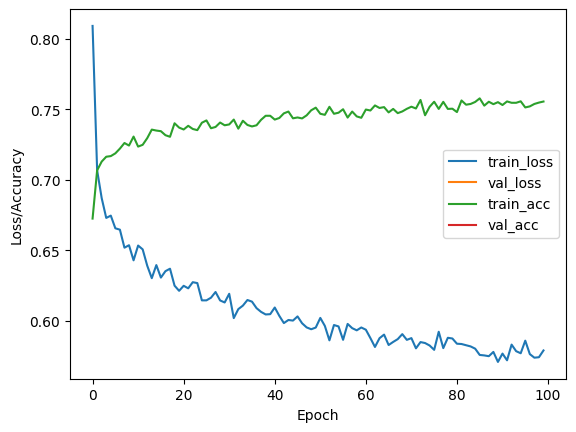

In [15]:
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.plot(history.history['accuracy'], label='train_acc')
plt.plot(history.history['val_accuracy'], label='val_acc')
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss/Accuracy")
plt.show()

In [228]:
preds = model.predict(testX)
y_pred = np.argmax(preds, axis=1)

cm = confusion_matrix(testY, y_pred)
print("Confusion Matrix:")
print(cm)

print("Classification Report:")
print(classification_report(testY, y_pred, target_names=classes))

173/173 [==============================] - 31s 158ms/step
Confusion Matrix:
[[  63   36   10    2]
 [  20   63  145   31]
 [   6   51  560  870]
 [   2    4  228 3440]]
Classification Report:
              precision    recall  f1-score   support

        dark       0.69      0.57      0.62       111
    mid-dark       0.41      0.24      0.31       259
   mid-light       0.59      0.38      0.46      1487
       light       0.79      0.94      0.86      3674

    accuracy                           0.75      5531
   macro avg       0.62      0.53      0.56      5531
weighted avg       0.72      0.75      0.72      5531



In [229]:
model.save('skin_tone_100_epoch_model_new_data.h5')
print("Model saved.")

c:\Users\ADMIN\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved.


## VALIDATE MODEL BASED ON REAL DATA


In [18]:
start = time.time()
diffusion_matrix = defaultdict(lambda: defaultdict(lambda: 0))
model = load_model('skin_tone_100_epoch_model_with_more_dark_data.h5')  # Replace with your model path
count = 0
data_source_path = "D:\Code\BachKhoa\AI Hackathon\mnt\md0\projects\sami-hackathon\private\data"
classes = ['dark', 'mid-dark', 'mid-light', 'light']

for img in image_data:
    img_link = os.path.join(data_source_path, img)
    image = cv2.imread(img_link)
    bbox = bbox_map[img]
    x, y, w, h = [int(coord) for coord in bbox]
    detected_face = image[y:y+h, x:x+w]
    # detected_face = extract_skin(detected_face)

    detected_face = cv2.resize(detected_face, (120, 90))
    detected_face = tf.keras.applications.mobilenet_v2.preprocess_input(detected_face[np.newaxis, ...])
    
    predictions = model.predict(detected_face)
    predicted_class_idx = np.argmax(predictions)
    predicted_class = classes[predicted_class_idx]
    
    count+=1
    if count==(3000):
        break
    
    diffusion_matrix[label_map[img]][predicted_class]+=1

    print(f"\033[91mImage: {img}. PREDICT: {predicted_class}. LABEL: {label_map[img]}. COUNT: {count}\033[0m")
    print(f"Accuracy: {(diffusion_matrix['dark']['dark'] + diffusion_matrix['mid-dark']['mid-dark'] + diffusion_matrix['mid-light']['mid-light'] + diffusion_matrix['light']['light']) / count}")
        

    
    print(f"{'':<10}{'Dark':<10}{'Mid-Dark':<10}{'Mid-Light':<10}{'Light':<10}")
    print(f"{'Dark':<10}{diffusion_matrix['dark']['dark']:<10}{diffusion_matrix['dark']['mid-dark']:<10}{diffusion_matrix['dark']['mid-light']:<10}{diffusion_matrix['dark']['light']:<10}")
    print(f"{'Mid-Dark':<10}{diffusion_matrix['mid-dark']['dark']:<10}{diffusion_matrix['mid-dark']['mid-dark']:<10}{diffusion_matrix['mid-dark']['mid-light']:<10}{diffusion_matrix['mid-dark']['light']:<10}")
    print(f"{'Mid-Light':<10}{diffusion_matrix['mid-light']['dark']:<10}{diffusion_matrix['mid-light']['mid-dark']:<10}{diffusion_matrix['mid-light']['mid-light']:<10}{diffusion_matrix['mid-light']['light']:<10}")
    print(f"{'Light':<10}{diffusion_matrix['light']['dark']:<10}{diffusion_matrix['light']['mid-dark']:<10}{diffusion_matrix['light']['mid-light']:<10}{diffusion_matrix['light']['light']:<10}")
    print(f"Accuracy: {(diffusion_matrix['dark']['dark'] + diffusion_matrix['mid-dark']['mid-dark'] + diffusion_matrix['mid-light']['mid-light'] + diffusion_matrix['light']['light']) / count}. COUNT: {count}")

finish = time.time()
print(f"Time: {finish - start}")

1/1 [==============================] - 1s 737ms/step
Image: 100016175.jpg. PREDICT: light. LABEL: light. COUNT: 1
Accuracy: 1.0
          Dark      Mid-Dark  Mid-Light Light     
Dark      0         0         0         0         
Mid-Dark  0         0         0         0         
Mid-Light 0         0         0         0         
Light     0         0         0         1         
Accuracy: 1.0. COUNT: 1
1/1 [==============================] - 0s 35ms/step
Image: 10004189.jpg. PREDICT: light. LABEL: light. COUNT: 2
Accuracy: 1.0
          Dark      Mid-Dark  Mid-Light Light     
Dark      0         0         0         0         
Mid-Dark  0         0         0         0         
Mid-Light 0         0         0         0         
Light     0         0         0         2         
Accuracy: 1.0. COUNT: 2
1/1 [==============================] - 0s 44ms/step
Image: 100104575.jpg. PREDICT: dark. LABEL: mid-light. COUNT: 3
Accuracy: 0.6666666666666666
          Dark      Mid-Dark  Mid-Light Lig